# Camera Calibration

Reference:

- [OpenCV - Camera Calibration](https://docs.opencv.org/master/dc/dbb/tutorial_py_calibration.html)

- [OpenCV - Camera Calibration and 3D Reconstruction](https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html)

- [阿洲的程式教學 - 相機校正](http://monkeycoding.com/?tag=camera-calibration)

- [Dissecting the Camera Matirx](http://ksimek.github.io/2013/08/13/intrinsic/)

- [Youtube - OTC3 相機校正—如何找出相機內部參數](https://www.youtube.com/watch?v=JF_pufTCQ1w)

In [1]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## Termination criteria

- cv2.TERM_CRITERIA_MAX_ITER:
        
        the maximum number of iterations or elements to compute


- cv2.TERM_CRITERIA_EPS: epsilon	

        the desired accuracy or change in parameters at which the iterative algorithm stops



In [2]:
# termination criteria
# MAX_ITER: 30 or EPS: 0.001
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

## Prepare object points

This is a 3d point in real-world space.

Example: (0, 0, 0), (1, 0, 0), (2, 0, 0) ..., (6, 5, 0)

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
columns, rows = 9, 6 # (width, height)
objp = np.zeros((rows*columns,3), np.float32)
objp[:,:2] = np.mgrid[0:columns,0:rows].T.reshape(-1,2)

In [4]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

In [5]:
# `glob`
# The glob module finds all the pathnames matching a specified pattern 
# according to the rules used by the Unix shell, 
# although results are returned in arbitrary order.
images = glob.glob('./img/*.jpg')

## Find the chess board corners

- [cv2.findChessboardCorners](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga93efa9b0aa890de240ca32b11253dd4a)

- [cv2.cornerSubPix](https://docs.opencv.org/master/dd/d1a/group__imgproc__feature.html#ga354e0d7c86d0d9da75de9b9701a9a87e)

- [cv2.drawChessboardCorners](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga6a10b0bb120c4907e5eabbcd22319022)

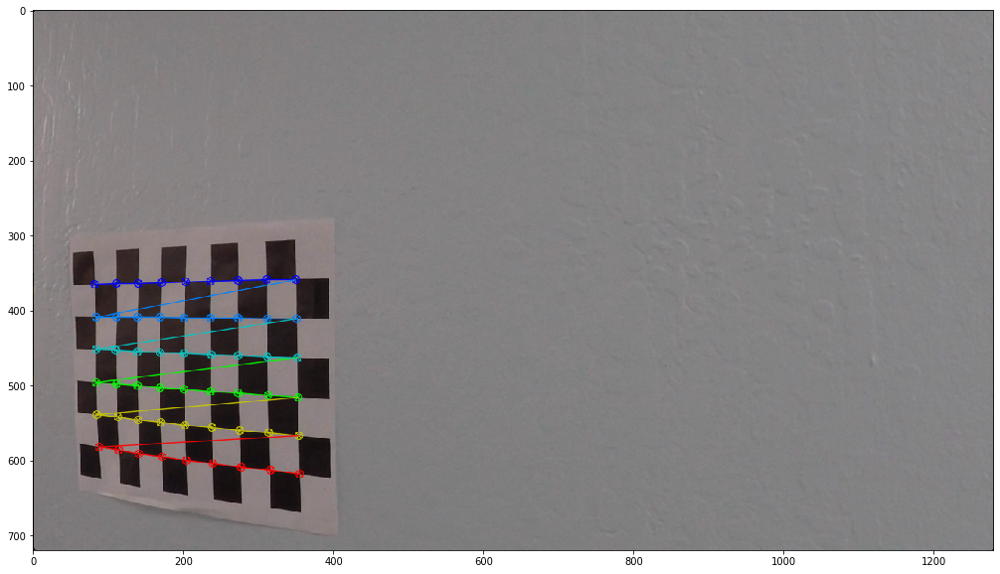

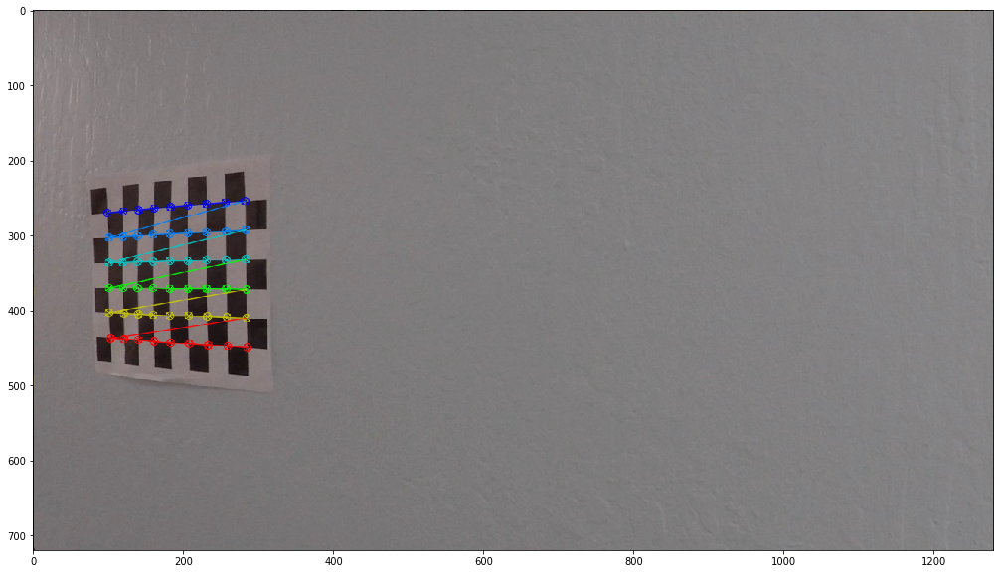

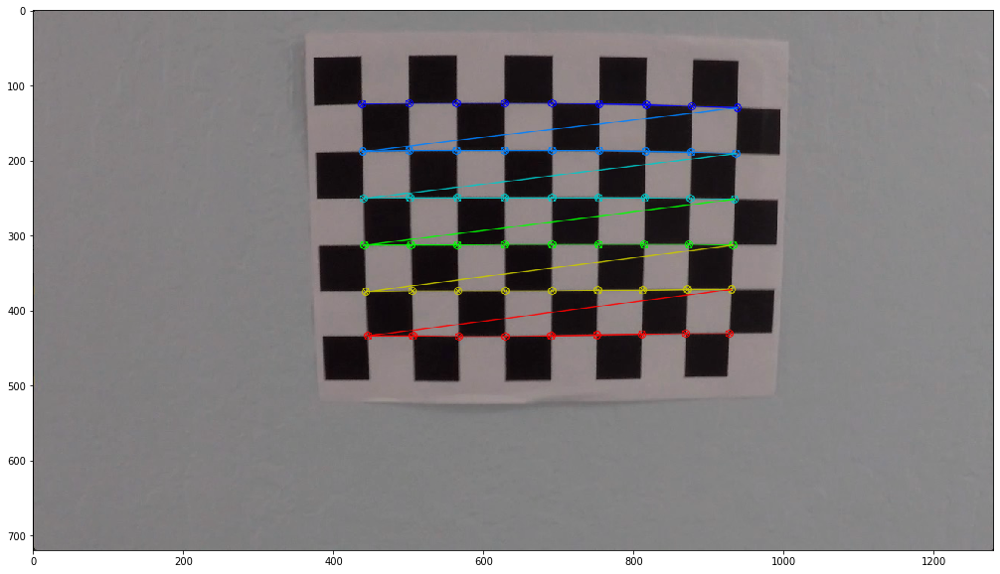

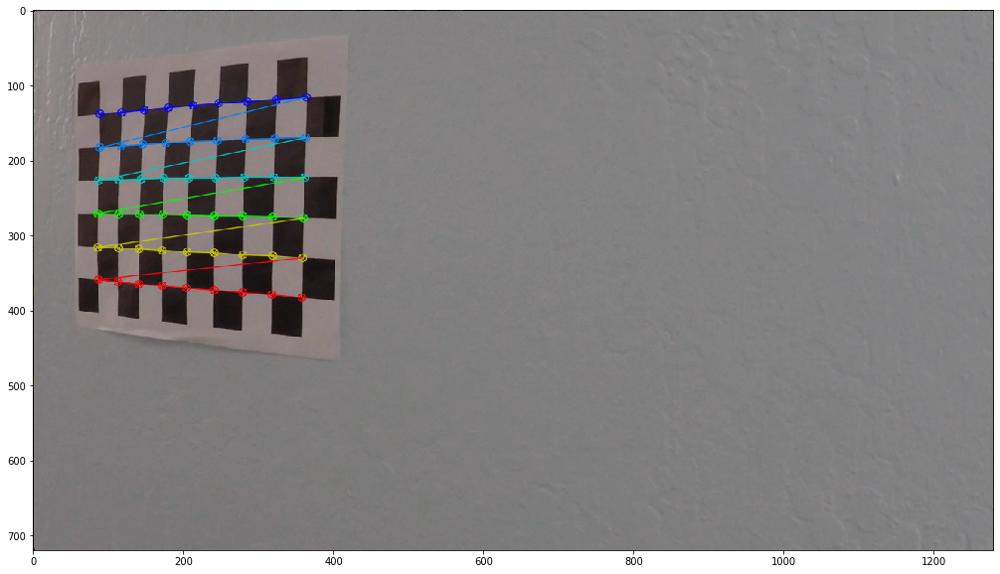

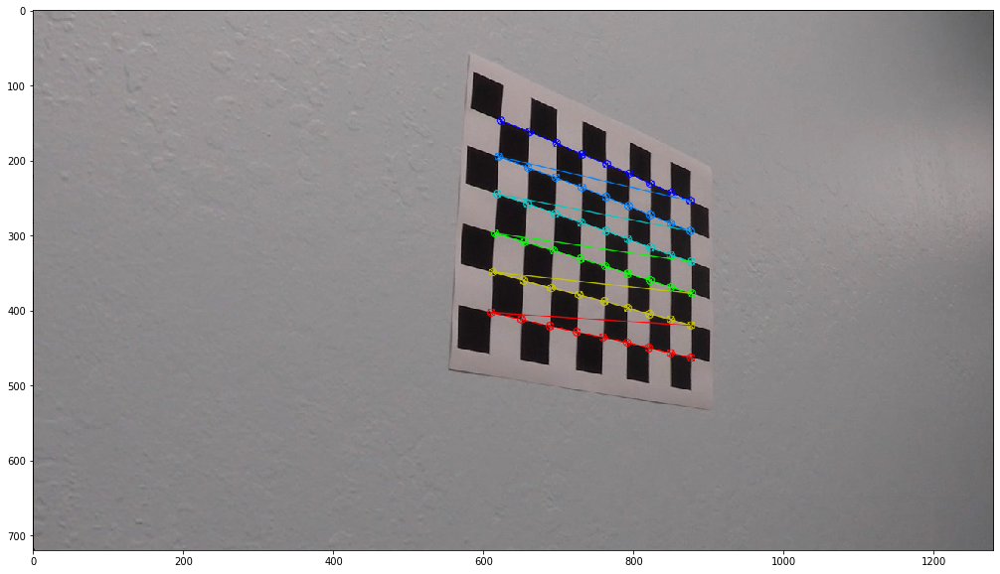

...

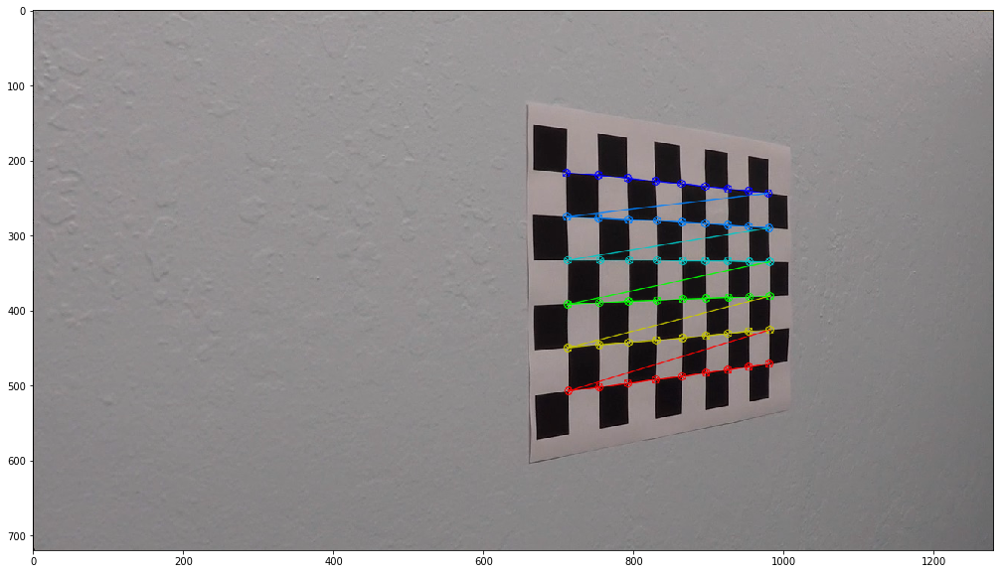

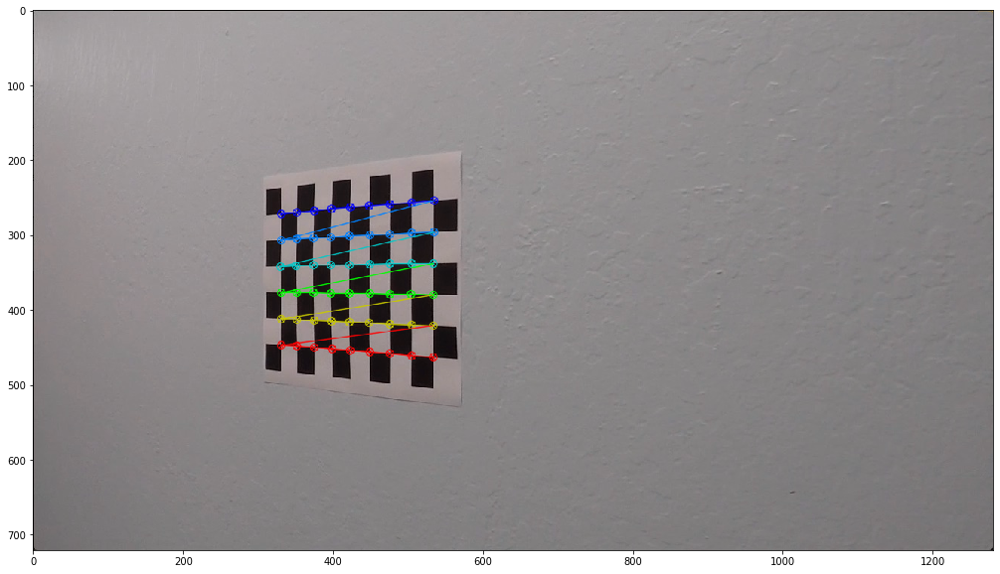

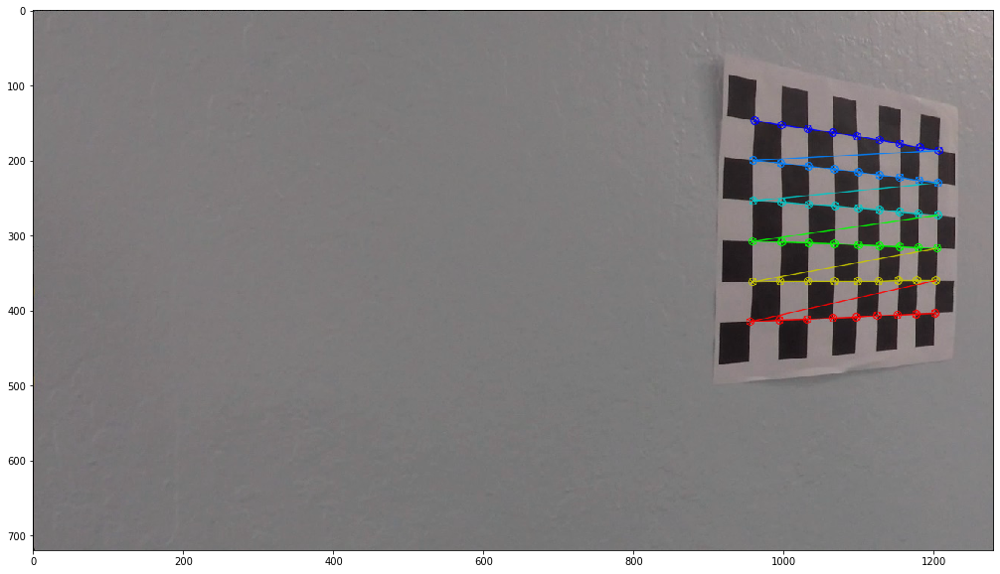

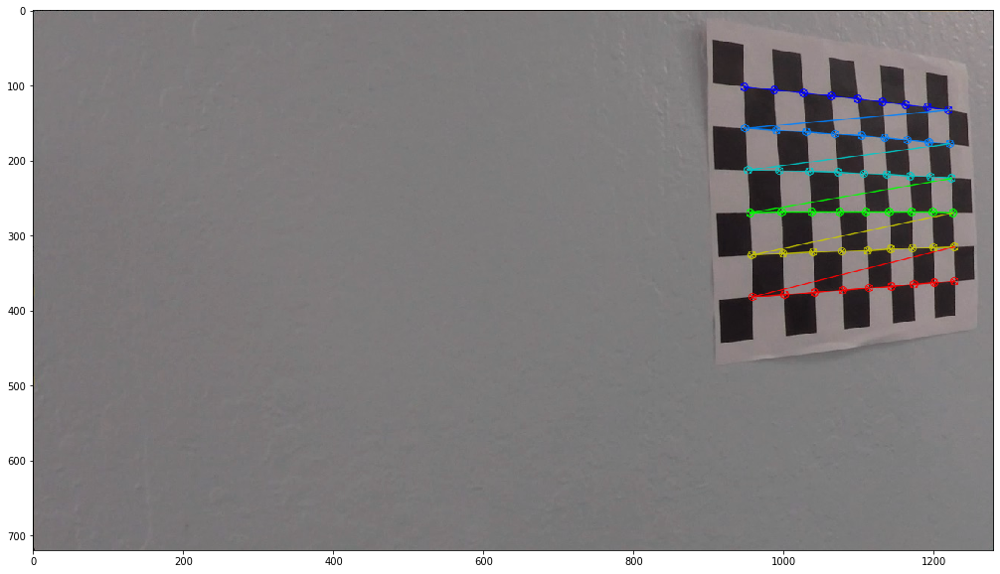

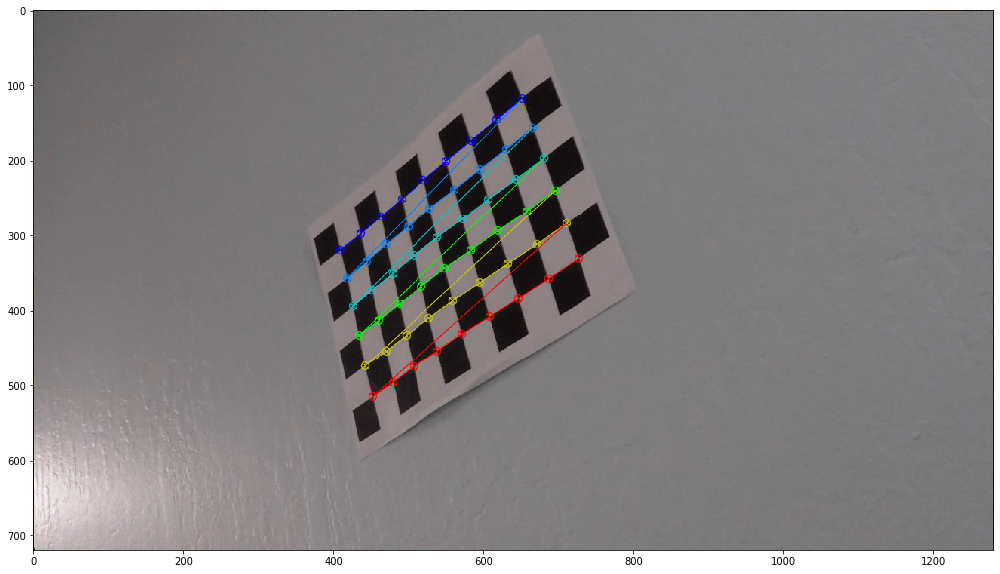

In [6]:
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (columns,rows), None)
    
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        
        # Refines the corner locations. 
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (columns,rows), corners2, ret)
        plt.figure(figsize=(20, 10))
        plt.imshow(img)

In [7]:
imgpoints

[array([[[ 82.1215  , 365.1789  ]],
 
        [[110.679855, 364.28693 ]],
 
        [[140.10007 , 363.5335  ]],
 
        [[170.72269 , 362.66245 ]],
 
        [[203.07579 , 361.8378  ]],
 
        [[236.45961 , 360.97504 ]],
 
        [[273.2892  , 360.22473 ]],
 
        [[311.06363 , 359.34583 ]],
 
        [[350.36298 , 358.50607 ]],
 
        [[ 83.69109 , 408.61725 ]],
 
        [[111.213615, 408.89856 ]],
 
        [[139.2526  , 409.0837  ]],
 
        [[169.41345 , 409.2996  ]],
 
        [[201.17453 , 409.51434 ]],
 
        [[236.29991 , 409.81036 ]],
 
        [[273.35532 , 410.1376  ]],
 
        [[311.53064 , 410.56436 ]],
 
        [[351.18823 , 410.8561  ]],
 
        [[ 83.68207 , 452.07016 ]],
 
        [[110.27445 , 453.31592 ]],
 
        [[138.78099 , 454.5915  ]],
 
        [[168.73865 , 455.92163 ]],
 
        [[201.10736 , 457.34143 ]],
 
        [[236.61743 , 458.62643 ]],
 
        [[273.32788 , 460.02493 ]],
 
        [[312.26828 , 461.60583 ]],
 
        [[35

## Apply Calibration

Now that we have our object points and image points, we are ready to go for calibration. We can use the function, [cv2.calibrateCamera](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d) which returns the `camera matrix`, `distortion coefficients`, `rotatio`n and `translation` vectors etc. 

In [8]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("Intrinsic matrix: ")
print(mtx)

Intrinsic matrix: 
[[1.15694035e+03 0.00000000e+00 6.65948595e+02]
 [0.00000000e+00 1.15213869e+03 3.88785180e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


## Undistortion

Now, we can take an image and undistort it. 

OpenCV comes with two methods for doing this. 
However first, we can refine the camera matrix based on a free scaling parameter using [cv2.getOptimalNewCameraMatrix()](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga7a6c4e032c97f03ba747966e6ad862b1).


    cv2.getOptimalNewCameraMatrix(
        cameraMatrix, 
        distCoeffs,
        imageSize,
        alpha,
        newImgSize,
        validPixROI=0,
        centerPrincipalPoint=false 
    )

    
- If the scaling parameter alpha=0, it returns undistorted image with minimum unwanted pixels. So it may even remove some pixels at image corners. 
- If alpha=1, all pixels are retained with some extra black images. This function also returns an image ROI which can be used to crop the result.

### Load an new image

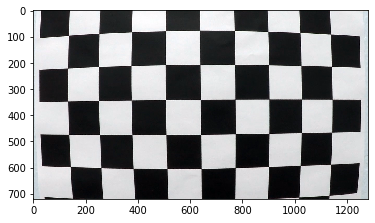

In [9]:
test_img = cv2.imread('test_img/test1.jpg')
h, w = test_img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

plt.imshow(test_img)

### Undistort and crop

This is the easiest way. Just call the function `cv2.undistortion` and use ROI obtained above to crop the result. 

In [10]:
# undistort
dst = cv2.undistort(test_img, mtx, dist, None, newcameramtx)

# crop the image
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.jpg', dst)

True

### Show the result

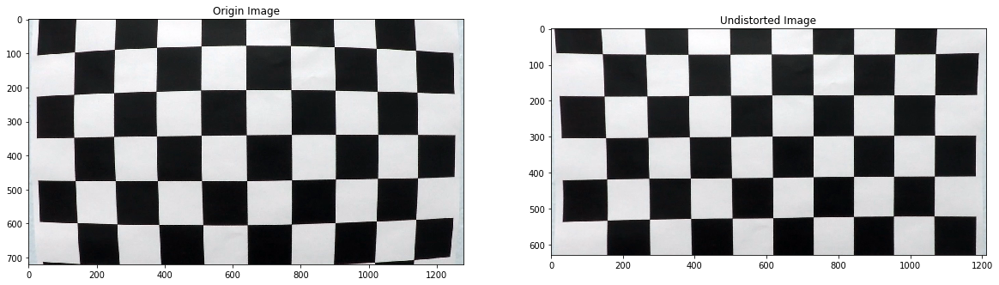

In [11]:
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.title("Origin Image")
plt.imshow(test_img)
plt.subplot(1,2,2)
plt.title("Undistorted Image")
plt.imshow(dst)

## Re-projection Error

Re-projection error gives a good estimation of just how exact the found parameters are. 
The `closer the re-projection error is to zero`, the more accurate the parameters we found are. 

Given the intrinsic, distortion, rotation and translation matrices, we must first transform the object point to image point using [cv2.projectPoints()](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga1019495a2c8d1743ed5cc23fa0daff8c). 
Then, we can calculate the absolute norm between what we got with our transformation and the corner finding algorithm. To find the average error, we calculate the arithmetical mean of the errors calculated for all the calibration images. 

In [12]:
# Reprojection error
total_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    total_error += error

print("total error: ", total_error/len(objpoints))

total error:  0.1084144234887673
